# Анализ тональности комментариев Youtube (Sentiment analysis)

## Загрузка необходимых библиотек

In [1]:
import re
import time
from tqdm import tqdm
 
import numpy as np
import pandas as pd
 

import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots

from selenium import webdriver

import nltk
from nltk.corpus import stopwords as nltk_stopwords
from pymystem3 import Mystem
from wordcloud import WordCloud

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import cross_validate
from sklearn.model_selection import train_test_split

from sklearn.linear_model import LogisticRegression

from sklearn.metrics import *

## Парсинг текстов комментариев

In [2]:
#Зададим путь к основной папке
path_main = r"/home/g/Desktop/Хакатон на волге/russian_youtube_coments_sentimen_analysis"

In [3]:
#Зададим путь к папке с chromedriver
path_chrome_driver = r"C:\Users\IvanovNikita"\
                      "\OneDrive - ООО «АЛЬМА Сервисез Компани»"\
                        "\Рабочий стол\data-utilitarian"\
                        "\Sentiment analysis\chromedriver_win32"\
                        "\chromedriver.exe"

### Парсинг текстов комментариев видео 1

In [4]:
from selenium.webdriver.support.wait import WebDriverWait
from selenium.webdriver.support import expected_conditions as EC
from selenium.webdriver.common.by import By

In [5]:
# Создаем список для результатов парсинга
scrapped = []

# Инициализируем наш экземпляр webdriver
with webdriver.Chrome() as driver:
    # Указываем время ожидания в секундах и URL видео
    wait = WebDriverWait(driver, 1)
    driver.get("https://www.youtube.com/watch?v=XrijmwJjUiQ")
    
    # Задаем количество прокруток для загрузки комментариев
    for item in tqdm(range(20)):
        wait.until(EC.visibility_of_element_located((By.TAG_NAME, "body"))).send_keys(webdriver.common.keys.Keys.END)
        # Указываем время ожидания в секундах после каждой прокрутки
        time.sleep(2)
        
    # Получаем комментарии по тэгу "#content"
    for comment in wait.until(EC.presence_of_all_elements_located((By.CSS_SELECTOR, "#content"))):
        # Добавляем тексты комментариев в список
        scrapped.append(comment.text)

100%|██████████| 20/20 [00:44<00:00,  2.23s/it]


In [6]:
len(scrapped)

170

In [7]:
comments = [x.split('\nОТВЕТИТЬ')[0].split('\n')[1] for x in scrapped[0].split('назад')][1:]

In [8]:
len(scrapped[1:])

169

In [9]:
comments_putin = comments + scrapped[1:]

In [10]:
for _ in range(10):

    print(comments_putin[np.random.randint(len(comments_putin))])

третью часть надо было бы делать исходя из того, что Билли после воскрешения стал темной сущностью как в "Кладбище домашних животных" и перевести подростковую героику в хоррор с черным юмором, это был бы разрыв на стримах
У меня есть вопрос. Зачем этих сестер заключали, если с помощью посоха у них можно забрать силы и они станут смертными? Или это эксклюзивное заклинание сестер?))
третью часть надо было бы делать исходя из того, что Билли после воскрешения стал темной сущностью как в "Кладбище домашних животных" и перевести подростковую героику в хоррор с черным юмором, это был бы разрыв на стримах
Обожаю этот визг Яйцаааа
Семья, самая важная часть франшизы. Ждём ещё и Доминика в трилогии 
У меня после твоего слова "к примеру" и когда ломается посох, появилась реклама 
Дед русалки- просто в голосину проорал!!!
Костя, отлично!!!! Крутой обзор!!! Ты сам себя подставил, теперь нельзя занижать планку!
То самое чуство, когда обзор на фильм интереснее чем сам фильм)
Шикарный обзор. Кинокос н

In [11]:
comments_putin_df = pd.DataFrame({'comment':comments_putin})

comments_putin_df.to_csv(path_main + '\\comments_putin.csv')

comments_putin_df

,comment
0,Reply
1,
2,
3,
4,
...,...
165,Дед русалки- просто в голосину проорал!!!
166,6:12 шепоты конечно убили
167,"На 27 минут, работа громенная. Сразу лайк."
168,Весь канал держится на шутках про темнокожих\n...


### Парсинг текстов комментариев видео 2

In [12]:
scrapped = []

with webdriver.Chrome() as driver:
    wait = WebDriverWait(driver, 1)
    driver.get("https://www.youtube.com/watch?v=Uy4aUXevKEE")

    for item in tqdm(range(20)): 
        wait.until(webdriver.support.expected_conditions.visibility_of_element_located(
            (By.TAG_NAME, "body"))).send_keys(webdriver.common.keys.Keys.END)
        time.sleep(2.5)

    for comment in wait.until(webdriver.support.expected_conditions.presence_of_all_elements_located(
        (By.CSS_SELECTOR, "#content"))):
        scrapped.append(comment.text)

100%|██████████| 20/20 [01:00<00:00,  3.05s/it]


In [13]:
len(scrapped)

168

In [14]:
comments = [x.split('\nОТВЕТИТЬ')[0].split('\n') for x in scrapped[0].split('назад')]

In [15]:
comments_1 = [x[1] for x in comments if len(x)>1 ][2:]

In [16]:
len(scrapped[1:])

167

In [17]:
comments_shulman = comments_1 + scrapped[1:]

In [18]:
len(comments_shulman)

167

for _ in range(10):

    print(comments_shulman[np.random.randint(len(comments_shulman))])

In [19]:
comments_shulman_df = pd.DataFrame({'comment':comments_shulman})

comments_shulman_df.to_csv(path_main + '\comments_shulman.csv')

comments_shulman_df

,comment
0,
1,
2,
3,
4,
...,...
162,"Екатерина Михайловна! С наступившим Вас, это о..."
163,"Большое вам спасибо, Екатерина Михайловна. И з..."
164,"Прекрасные слова, прекрасная Екатерина! Смотри..."
165,"Екатерина, спасибо за важные слова! В канун 20..."


## Загрузка размеченного датасета study.mokoron
Источник https://study.mokoron.com/

In [20]:
positive = pd.read_csv(path_main + '/russian_sentiment_tweet_automated_labeled/positive.csv',
                       sep = ';',
                       header= None
                      )

In [21]:
negative = pd.read_csv(path_main + '/russian_sentiment_tweet_automated_labeled/negative.csv',
                       sep = ';',
                       header= None
                      )

In [22]:
positive_text = pd.DataFrame(positive.iloc[:, 3])
negative_text = pd.DataFrame(negative.iloc[:, 3])

In [23]:
positive_text['label'] = [1] * positive_text.shape[0]
negative_text['label'] = [0] * negative_text.shape[0]

In [24]:
labeled_tweets = pd.concat([positive_text, negative_text])

In [25]:
labeled_tweets.index = range(labeled_tweets.shape[0])

In [26]:
labeled_tweets.columns = ['text', 'label']
labeled_tweets

,text,label
0,"@first_timee хоть я и школота, но поверь, у на...",1
1,"Да, все-таки он немного похож на него. Но мой ...",1
2,RT @KatiaCheh: Ну ты идиотка) я испугалась за ...,1
3,"RT @digger2912: ""Кто то в углу сидит и погибае...",1
4,@irina_dyshkant Вот что значит страшилка :D\nН...,1
...,...,...
226829,Но не каждый хочет что то исправлять:( http://...,0
226830,скучаю так :-( только @taaannyaaa вправляет мо...,0
226831,"Вот и в школу, в говно это идти уже надо(",0
226832,"RT @_Them__: @LisaBeroud Тауриэль, не грусти :...",0


### Очистка размеченного датасета

Напишем фукнцию для очистки текстов от лишних символов

In [27]:
# Оставим в тексте только кириллические символы
def clear_text(text):
    clear_text = re.sub(r'[^А-яЁё]+', ' ', text).lower()
    return " ".join(clear_text.split())
    

# напишем функцию удаляющую стоп-слова
def clean_stop_words(text, stopwords):
    text = [word for word in text.split() if word not in stopwords]
    return " ".join(text)

In [28]:
nltk.download('stopwords')
# загрузим список стоп-слов
stopwords = set(nltk_stopwords.words('russian'))
np.array(stopwords)

[nltk_data] Downloading package stopwords to /home/g/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


array({'как', 'вас', 'опять', 'они', 'всего', 'том', 'ж', 'потому', 'эти', 'ни', 'с', 'этой', 'тогда', 'чуть', 'ты', 'ей', 'раз', 'в', 'тем', 'перед', 'какая', 'конечно', 'три', 'не', 'быть', 'же', 'их', 'всю', 'будто', 'сейчас', 'может', 'кто', 'его', 'тот', 'нее', 'более', 'если', 'то', 'по', 'над', 'а', 'этого', 'чтобы', 'без', 'куда', 'зачем', 'можно', 'сам', 'тоже', 'нет', 'будет', 'теперь', 'нибудь', 'много', 'еще', 'где', 'впрочем', 'него', 'через', 'хорошо', 'и', 'у', 'что', 'он', 'там', 'уж', 'был', 'из', 'есть', 'под', 'надо', 'два', 'при', 'тут', 'лучше', 'только', 'ведь', 'себя', 'чтоб', 'было', 'этом', 'какой', 'ему', 'этот', 'всегда', 'почти', 'между', 'один', 'нельзя', 'хоть', 'того', 'но', 'им', 'все', 'иногда', 'моя', 'совсем', 'чего', 'для', 'ним', 'были', 'меня', 'об', 'так', 'со', 'я', 'свою', 'про', 'она', 'ну', 'ее', 'или', 'ничего', 'когда', 'потом', 'от', 'после', 'эту', 'до', 'вы', 'такой', 'о', 'за', 'да', 'мы', 'никогда', 'мой', 'вот', 'наконец', 'вам', 'нас'

In [29]:
# Протестируем работу функции очистки текста
text = labeled_tweets['text'][np.random.randint(labeled_tweets.shape[0])]
print(text)
print('=======================================')
print(clean_stop_words((clear_text(text)), stopwords))

Остался последний день.Скоро я буду дома и смогу отдыхать...этот день был такой длинный ((
остался последний день скоро буду дома смогу отдыхать день длинный


In [30]:
start_clean = time.time()

labeled_tweets['text_clear'] = labeled_tweets['text'].apply(lambda x: clean_stop_words(clear_text(str(x)), stopwords))

print('Обработка текстов заняла: '+str(round(time.time() - start_clean, 2))+' секунд')

Обработка текстов заняла: 2.86 секунд


In [31]:
labeled_tweets = labeled_tweets[['text_clear', 'label']]
labeled_tweets

,text_clear,label
0,школота поверь самое общество профилирующий пр...,1
1,таки немного похож мальчик равно,1
2,идиотка испугалась,1
3,углу сидит погибает голода ещё порции взяли хо...,1
4,значит страшилка блин посмотрев части создастс...,1
...,...,...
226829,каждый хочет исправлять,0
226830,скучаю вправляет мозги равно скучаю,0
226831,школу говно это идти,0
226832,тауриэль грусти обнял,0


In [32]:
labeled_tweets.to_csv(path_main + '\\labeled_tweets_clean.csv')

## Загрузка размеченного датасета  Linis Crowd
Источник http://www.linis-crowd.org/

In [33]:
pip install openpyxl

Note: you may need to restart the kernel to use updated packages.


In [34]:
labeled_texts_1 = pd.read_excel(
    path_main + '/linis_crowd_dataset/doc_comment_summary.xlsx',
    sheet_name = 0,
    header=None
    )

In [35]:
labeled_texts_1

,0,1
0,Но при мужчине ни одна приличная женщина не по...,-1
1,Украина это часть Руси искусственно отделенная...,-1
2,Как можно говорить об относительно небольшой к...,-1
3,1.2014. а что они со своими поляками сделали?...,0
4,у а фильмы... Зрители любят диковинное. у ме...,0
...,...,...
26868,Многих заставляют. Многие сами проявляют излиш...,-1
26869,Очередной Чубайс. ну а чего нового то? Сорос ...,-1
26870,"Закон, как все предыдущие - абсолютный бред и ...",0
26871,дело которое ты делаешь сейчас - оно очень хор...,0


In [36]:
labeled_texts_1['label'] = pd.to_numeric(labeled_texts_1.iloc[:, 1], errors='coerce')

In [37]:
labeled_texts_1 = labeled_texts_1[[0, 'label']]

In [38]:
labeled_texts_1.columns = ['text', 'label']

In [39]:
labeled_texts_1.label.value_counts()

label
 0.0        13930
-1.0         9203
 1.0         1795
-2.0         1534
 2.0          365
 22158.0        2
 21887.0        1
 23486.0        1
 23523.0        1
Name: count, dtype: int64

In [40]:
ind_drop = labeled_texts_1.query('label > 2 or label < - 2').index

ind_drop

Index([10224, 15325, 15786, 17474, 26375], dtype='int64')

In [41]:
labeled_texts_1 = labeled_texts_1.query('index not in @ind_drop')

In [42]:
for _ in range(4):
    
    sample = labeled_texts_1.sample(n = 1)
    
    print('label: ', sample.label.values[0])
    
    print(sample['text'].values[0][:200]) 
    
    print()

label:  0.0
Спасибо,очень интересный материал)))  Всё больше и больше фактов о том что Хрущёв-то и был тем  Кровавым Сталиным .  Начальник Центрального архива полковник В.И. Детинин рассказывал , например, о Хрущ

label:  -1.0
Подписаться на рассылку или отказаться от рассылки можно здесь.  Я бы Навального. Как-то после всех арестов он стал мне симпатичен:)  Только не Навальный  В опросе не хватает как минимум одного пункта

label:  -1.0
А с иностранцами как будут поступать? Неугодных возвращать в свои страны домой? А то,как ведется строительство в городе,мильон раз писано,только город уже потерял свой облик давно. Кто не был в Сочи д

label:  -1.0
ivejournal.com/5892.html  К Ходорковскому я отношусь с уважением, мужик достойно держался все это время.Меня зовут Борис и я не возражаю против обращения на ты))  Притомился и от скуки решил помиловат



In [43]:
selected = labeled_texts_1.query('label != 0')

In [44]:
selected.label.value_counts()

label
-1.0    9203
 1.0    1795
-2.0    1534
 2.0     365
Name: count, dtype: int64

In [45]:
selected.loc[:, 'label_binary'] = np.nan

/tmp/ipykernel_12515/2569160575.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  selected.loc[:, 'label_binary'] = np.nan


In [46]:
selected.loc[((selected['label'] == -1) |
         (selected['label'] == -2)), 'label_binary'] = 0

In [47]:
selected.loc[((selected['label'] == 1) |
         (selected['label'] == 2)), 'label_binary'] = 1

In [48]:
selected.label_binary.value_counts()

label_binary
0.0    10737
1.0     2160
Name: count, dtype: int64

In [49]:
for _ in range(3):
    
    sample_neg = selected.query('label_binary == 0').sample(n = 1)
    
    sample_pos = selected.query('label_binary == 1').sample(n = 1)
    
    print('label: ', sample_pos.label_binary.values[0])
    
    print(sample_pos['text'].values[0][:200]) 
    
    print('label: ', sample_neg.label_binary.values[0])
    
    print(sample_neg['text'].values[0][:200]) 
    
    print()

label:  1.0
 итого 40 млн.х5000=200 000 000 000, т.е 200 млр.или больше.   ого!!!!но у нас тут заруба... что такое сочи.....  просто папа служил на севере , и он подводник, у них там свои особые условия, какие-то
label:  0.0
У него, Света, совсем никого нет, его 45 лет стажа никому не нужны, опыт не востребован. У него 3 френда в ЖЖ, из которых один - он сам, а два другие его зафрендили в качестве ответной вежливости. У н

label:  1.0
ля него тоже поворот запретят?  Я пару-тройку раз стоял в пробке 3-Енисейская-Конева, и, как мне показалось, проблема там в 4 светофорах, точнее в несогласованности их фаз и временных интервалов. Свет
label:  0.0
И почему то никто ей  не влепил двушечку .Этой можно, а тем нельзя? Так что ли? Эту не только не наказали, ещё и каким-то там третьим лицом путина сделали.. Девки то плясали не больше минуты, а на Авр

label:  1.0
пасибо за репортаж  спасибо! Впечатляют фото. Наши оружейники оперативно копии делают.  Здравствуй Дервиш! Конкретно по фоткам. Очень 

## Лемматизация текстов

In [50]:
start_clean = time.time()

selected['text_clear'] = selected['text']\
                               .apply(lambda x:
                                      clean_stop_words(
                                        clear_text(str(x)),
                                        stopwords))

print('Обработка текстов заняла: '+str(round(time.time() - start_clean, 2))+' секунд')

Обработка текстов заняла: 1.81 секунд


/tmp/ipykernel_12515/3338079758.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  selected['text_clear'] = selected['text']\


In [51]:
def lemmatize(df : (pd.Series, pd.DataFrame),
              text_column : (None, str),
              n_samples : int,
              break_str = 'br',
             ) -> pd.Series:
    """
    Принимает:
    df -- таблицу или столбец pandas содержащий тексты,
    text_column -- название столбца указываем если передаем таблицу,
    n_samples -- количество текстов для объединения,
    break_str -- символ разделения, нужен для ускорения,
    количество текстов записанное в n_samples объединяется 
    в одит большой текст с предварительной вставкой символа 
    записанного в break_str между фрагментами
    затем большой текст лемматизируется, после чего разбивается на
    фрагменты по символу break_str
    
    
    Возвращает:
    Столбец pd.Series с лемматизированными текстами
    в которых все слова приведены к изначальной форме:
    * для существительных — именительный падеж, единственное число;
    * для прилагательных — именительный падеж, единственное число,
    мужской род;
    * для глаголов, причастий, деепричастий — глагол в инфинитиве 
    (неопределённой форме) несовершенного вида.
    
    """
    
    result = []
    
    m = Mystem()    
    
    for i in tqdm(range((df.shape[0] // n_samples) + 1)) :
        
        start = i * n_samples
        
        stop = start + n_samples
        
        sample = break_str.join(df[text_column][start : stop].values)
        
        lemmas = m.lemmatize(sample)
        
        lemm_sample = ''.join(lemmas).split(break_str)
        
        result += lemm_sample
        
    return pd.Series(result, index = df.index)

In [52]:
selected['lemm_clean_tex'] = lemmatize(
    df = selected,
    text_column = 'text_clear',
    n_samples = 100,
    break_str = 'br',
    )

100%|██████████| 130/130 [00:58<00:00,  2.22it/s]
/tmp/ipykernel_12515/959808114.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  selected['lemm_clean_tex'] = lemmatize(


In [53]:
selected.head()

,text,label,label_binary,text_clear,lemm_clean_tex
0,Но при мужчине ни одна приличная женщина не по...,-1.0,0.0,мужчине одна приличная женщина пойдет лазить р...,мужчина один приличный женщина пойти лазить ра...
1,Украина это часть Руси искусственно отделенная...,-1.0,0.0,украина это часть руси искусственно отделенная...,украина это часть русь искусственно отделять к...
2,Как можно говорить об относительно небольшой к...,-1.0,0.0,говорить относительно небольшой коррупции обра...,говорить относительно небольшой коррупция обра...
5,Государство не может сейчас платить больше и м...,-1.0,0.0,государство платить посмотрите денежный поток ...,государство платить посмотреть денежный поток ...
8,эксплуатируемые способны только на бунты - бес...,-1.0,0.0,эксплуатируемые способны бунты бессмысленные б...,эксплуатируемые способный бунт бессмысленный б...


In [54]:
labeled_tweets['lemm_text_clear'] = lemmatize(
    df = labeled_tweets,
    text_column = 'text_clear',
    n_samples = 1000,
    break_str = 'br',
    )

  0%|          | 0/227 [00:00<?, ?it/s]

100%|██████████| 227/227 [00:51<00:00,  4.39it/s]


In [55]:
labeled_tweets

,text_clear,label,lemm_text_clear
0,школота поверь самое общество профилирующий пр...,1,школоть поверять самый общество профилировать ...
1,таки немного похож мальчик равно,1,таки немного похожий мальчик равно
2,идиотка испугалась,1,идиотка испугалась
3,углу сидит погибает голода ещё порции взяли хо...,1,углу сидеть погибать голод еще порция взять хо...
4,значит страшилка блин посмотрев части создастс...,1,значит страшилка блин посмотреть часть создава...
...,...,...,...
226829,каждый хочет исправлять,0,каждый хотеть исправлять
226830,скучаю вправляет мозги равно скучаю,0,скучаю вправлять мозги равный скучаю
226831,школу говно это идти,0,школу гавно это идти
226832,тауриэль грусти обнял,0,тауриэль грусть обнял


## Объединение двух наборов текстов

In [56]:
sample_1 = labeled_tweets[['text_clear', 'lemm_text_clear', 'label']]

sample_2 = selected[['text_clear', 'lemm_clean_tex', 'label_binary']]

In [57]:
sample_2.columns = ['text_clear','lemm_text_clear', 'label']

In [58]:
sample_2.isna().sum()

text_clear          0
lemm_text_clear     0
label              41
dtype: int64

In [59]:
sample_2 = sample_2.dropna()
sample_2.isna().sum()

text_clear         0
lemm_text_clear    0
label              0
dtype: int64

In [60]:
joned_text = pd.concat([sample_1, sample_2])

In [61]:
joned_text

,text_clear,lemm_text_clear,label
0,школота поверь самое общество профилирующий пр...,школоть поверять самый общество профилировать ...,1.0
1,таки немного похож мальчик равно,таки немного похожий мальчик равно,1.0
2,идиотка испугалась,идиотка испугалась,1.0
3,углу сидит погибает голода ещё порции взяли хо...,углу сидеть погибать голод еще порция взять хо...,1.0
4,значит страшилка блин посмотрев части создастс...,значит страшилка блин посмотреть часть создава...,1.0
...,...,...,...
26864,великое испытание выпало долю наших предков ве...,великое испытание выпадать доля наш предок веч...,1.0
26865,н своему поведению крайне низкий человек прост...,н свой поведение крайне низкий человек прощать...,0.0
26866,многие психологические книги кричат женщины да...,многие психологический книга кричать женщина д...,1.0
26868,многих заставляют многие сами проявляют излишн...,многих заставлять многий сам проявлять излишни...,0.0


In [62]:
joned_text.label.value_counts()


label
0.0    122660
1.0    117071
Name: count, dtype: int64

In [63]:
joned_text.columns = ['text', 'lemm_text', 'label']

In [64]:
joned_text.index = range(joned_text.shape[0])

In [65]:
joned_text.isna().sum()

text         0
lemm_text    0
label        0
dtype: int64

In [66]:
joned_text = joned_text.dropna()
joned_text.isna().sum()

text         0
lemm_text    0
label        0
dtype: int64

## Получение TF-IDF векторных представлений размеченных текстов

Для обучения классификатора получим значения IDF (inference document frequency) для слов из тренировочного набора данных, значения IDF равны логарифму отношения количества документов к количеству документов содержащих искомое слово. Например для стандартных слов, которые встречаются практически в любом тексте IDF будет близок к единице, а для специфичных, которые встречаются в одном тексте из 100 это значение будет равно уже 2 (если мы берем основание логарифма 10).

Затем получив словарь со значениями IDF мы можем получить векторное представление каждого текста по следующему принципу, значения IDF слова умножаем на значения

In [67]:
sample_2.columns = ['text', 'text_lemm', 'label']

In [68]:
sample_1.columns = ['text', 'text_lemm', 'label']

In [69]:
# предварительно разделим выборку на тестовую и обучающую
train, test = train_test_split(sample_1,
                        test_size = 0.2,
                        random_state = 12348,
                       )

print(train.shape)
print(test.shape)

(181467, 3)
(45367, 3)


In [70]:
train

,text,text_lemm,label
162424,учёные заметили кредитных договорах самом низу...,учёные замечать кредитный договор самый низ ст...,0
160594,капец голова болит заболел походу работу ехать,капец голова болеть заболевать поход работа ехать,0
189688,взяла твиттер удалила,взяла твиттер удалила,0
78348,оно понятно определилась,оно понятный определилась,1
157114,уроки нужно сделать контре подготовиться,уроки нужно сделать контра подготовиться,0
...,...,...,...
141717,кажется начинаю остывать это очень ху холодно,кажется начинать остывать это очень ху холодно,0
207453,дорогой дело твое просто очень грустно преврат...,дорогой дело твой просто очень грустно превращ...,0
36863,председатель правительства рф дмитрий медведев...,председатель правительство рф дмитрий медведев...,1
146555,аххаха баба фрося аххахаха глуши нить,аххаха баба фрося аххахах глушь нить,0


In [71]:
# Сравним распределение целевого признака
for sample in [train, test]:    
    print(sample[sample['label'] == 1].shape[0] / sample.shape[0])

0.5066265491797407
0.5064253752727753


In [72]:
count_idf_positive = TfidfVectorizer(ngram_range = (1,1))
count_idf_negative = TfidfVectorizer(ngram_range = (1,1))

tf_idf_positive = count_idf_positive.fit_transform(train.query('label == 1')['text'])
tf_idf_negative = count_idf_negative.fit_transform(train.query('label == 0')['text'])

In [73]:
# Сохраним списки Idf для каждого класса
positive_importance = pd.DataFrame(
    {'word' : count_idf_positive.get_feature_names_out(),
     'idf' : count_idf_positive.idf_
    }).sort_values(by = 'idf', ascending = False)

negative_importance = pd.DataFrame(
    {'word' : count_idf_negative.get_feature_names_out(),
     'idf' : count_idf_negative.idf_
    }).sort_values(by = 'idf', ascending = False)

In [74]:
positive_importance.query('word not in @negative_importance.word and idf < 10.8')

,word,idf
34257,клал,10.637099
56843,отпуском,10.637099
57541,охрененный,10.637099
55852,ответныйфолловинг,10.637099
56045,отдельную,10.637099
...,...,...
70829,продолжай,9.209983
93370,улыбнуло,8.667659
53367,оглядываются,8.557658
73605,разблокируют,8.537039


In [75]:
negative_importance.query('word not in @positive_importance.word and idf < 10')

,word,idf
30801,красноярцы,9.917445
8270,взорвалась,9.917445
40278,начаться,9.917445
74891,терактов,9.917445
58453,прискорбно,9.917445
...,...,...
68023,скорбим,8.595689
52192,погибших,8.395018
41110,некролог,8.359300
74888,теракт,8.308007


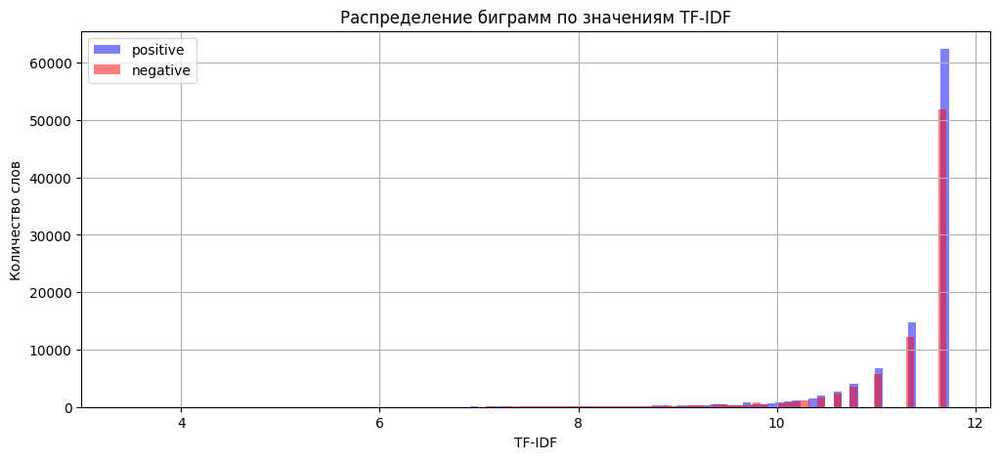

In [76]:
fig = plt.figure(figsize = (12,5))
positive_importance.idf.hist(bins = 100,
                             label = 'positive',
                             alpha = 0.5,
                             color = 'b',
                            )
negative_importance.idf.hist(bins = 100,
                             label = 'negative',
                             alpha = 0.5,
                             color = 'r',
                            )
plt.title('Распределение биграмм по значениям TF-IDF')
plt.xlabel('TF-IDF')
plt.ylabel('Количество слов')
plt.legend()
plt.show()

## Предварительное обучение моделей

In [77]:
# Получим векторные представления текстов
count_idf_1 = TfidfVectorizer(ngram_range=(1,1))

In [78]:
tf_idf_base_1 = count_idf_1.fit(sample_1['text'])
tf_idf_train_base_1 = count_idf_1.transform(train['text'])
tf_idf_test_base_1 = count_idf_1.transform(test['text'])

In [79]:
display(tf_idf_test_base_1.shape)
display(tf_idf_train_base_1.shape)

(45367, 170344)

(181467, 170344)

In [80]:
model_lr_base_1 = LogisticRegression(solver = 'lbfgs',
                                    random_state = 12345,
                                    max_iter= 10000,
                                    n_jobs= -1)

Получим прогноз и оценим качество модели

In [81]:
model_lr_base_1.fit(tf_idf_train_base_1, train['label'])

LogisticRegression(max_iter=10000, n_jobs=-1, random_state=12345)

In [82]:
predict_lr_base_proba = model_lr_base_1.predict_proba(tf_idf_test_base_1)

### Сравнение качества классификации на лемматизированных текстах

In [83]:
# Получим векторные представления лемматизированных текстов
count_idf_lemm = TfidfVectorizer(ngram_range=(1,1))

In [84]:
tf_idf_lemm = count_idf_lemm.fit(sample_1['text_lemm'])
tf_idf_train_lemm = count_idf_lemm.transform(train['text_lemm'])
tf_idf_test_lemm = count_idf_lemm.transform(test['text_lemm'])

In [85]:
display(tf_idf_train_lemm.shape)
display(tf_idf_test_lemm.shape)

(181467, 134455)

(45367, 134455)

In [86]:
model_lr_lemm = LogisticRegression(solver = 'lbfgs',
                                    random_state = 12345,
                                    max_iter= 10000,
                                    n_jobs= -1)

Получим прогноз и оценим качество модели

In [87]:
model_lr_lemm.fit(tf_idf_train_lemm, train['label'])

LogisticRegression(max_iter=10000, n_jobs=-1, random_state=12345)

In [88]:
predict_lr_lemm_proba = model_lr_lemm.predict_proba(tf_idf_test_lemm)

В качестве сравнения сделаем классификатор который в качестве прогноза выдает случайное число в интервале от 0 до 1 

In [89]:
def coin_classifier(X:np.array) -> np.array:
    predict = np.random.uniform(0.0, 1.0, X.shape[0])
    return predict

In [90]:
coin_predict = coin_classifier(tf_idf_test_base_1)

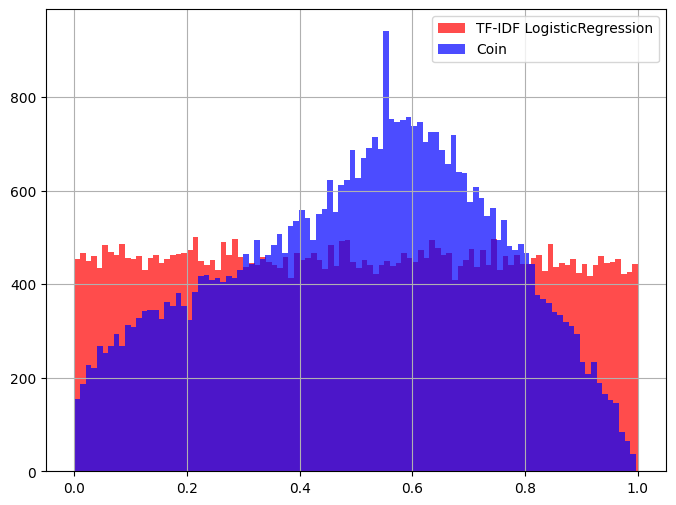

In [91]:
fif = plt.figure(figsize = (8, 6))

pd.Series(coin_predict)\
                .hist(bins = 100,
                      alpha = 0.7,
                      color = 'r',
                      label = 'TF-IDF LogisticRegression'
                     )

pd.Series(predict_lr_base_proba[:, 1])\
                .hist(bins = 100,
                      alpha = 0.7,
                      color = 'b',
                      label = 'Coin'
                     )
plt.legend()   
plt.show()

### Визуализация ROC-кривых классификаторов

In [92]:
fpr_base, tpr_base, _ = roc_curve(test['label'], predict_lr_base_proba[:, 1])
roc_auc_base = auc(fpr_base, tpr_base)

In [93]:
fpr_lemm, tpr_lemm, _ = roc_curve(test['label'], predict_lr_lemm_proba[:, 1])
roc_auc_lemm = auc(fpr_lemm, tpr_lemm)

In [94]:
fpr_coin, tpr_coin, _ = roc_curve(test['label'], coin_predict)
roc_auc_coin = auc(fpr_base, tpr_base)

Note: you may need to restart the kernel to use updated packages.


In [96]:
fig = make_subplots(1,1,
                    subplot_titles = ["Receiver operating characteristic"],
                    x_title="False Positive Rate",
                    y_title = "True Positive Rate"
                   )

fig.add_trace(go.Scatter(
    x = fpr_lemm,
    y = tpr_lemm,
    fill = 'tozeroy',
    name = "ROC lemm (area = %0.3f)" % roc_auc_lemm,
    ))

fig.add_trace(go.Scatter(
    x = fpr_base,
    y = tpr_base,
    #fill = 'tozeroy',
    name = "ROC base (area = %0.3f)" % roc_auc_base,
    ))

fig.add_trace(go.Scatter(
    x = fpr_coin,
    y = tpr_coin,
    mode = 'lines',
    line = dict(dash = 'dash'),
    name = 'Coin classifier (area = 0.5)'
    ))


fig.update_layout(
    height = 600,
    width = 800,
    xaxis_showgrid=False,
    xaxis_zeroline=False,
    template = 'plotly_dark',
    font_color = 'rgba(212, 210, 210, 1)'
    )

In [97]:
# Выведем матрицы ошибок
confusion_matrix(test['label'],
                 (predict_lr_base_proba[:, 1] > 0.5).astype('float'),
                 normalize='true',
                )

array([[0.69087174, 0.30912826],
       [0.22611534, 0.77388466]])

In [98]:
# Выведем матрицу ошибок
confusion_matrix(test['label'],
                 (predict_lr_lemm_proba[:, 1] > 0.5).astype('float'),
                 normalize='true',
                )

array([[0.68573598, 0.31426402],
       [0.23856366, 0.76143634]])

### Визуализация важности признаков

In [99]:
# Получим веса признаков, то есть множители 
# подобранные логистической регрессией 
# для каждого компонента вектора tf-idf

weights = pd.DataFrame({'words': count_idf_1.get_feature_names_out(),
                        'weights': model_lr_base_1.coef_.flatten()})
weights_min = weights.sort_values(by= 'weights')
weights_max = weights.sort_values(by= 'weights', ascending = False)

In [100]:
weights_min = weights_min[:100]
weights_min['weights'] = weights_min['weights'] * -1
weights_min

,words,weights
85419,обидно,6.913103
28964,грустно,6.084366
39067,жаль,6.079559
98823,печально,5.833986
132462,скучаю,5.404337
...,...,...
165003,шерлок,2.627262
150793,уехала,2.616252
27141,голова,2.614374
131999,скорбим,2.602910


In [101]:
weights_max = weights_max[:100]
weights_max

,words,weights
5503,ахаха,4.534309
5502,ахах,4.350795
86118,обожаю,4.257824
20898,вромайдан,4.250785
5539,ахахах,4.214947
...,...,...
123673,рекомендую,2.029361
152732,ураааа,2.025813
67727,майдан,2.022084
134420,снов,2.014394


In [102]:
# Воспользуемся библиотекой wordcloud для генерации картинок

wordcloud_positive = WordCloud(background_color="white",
                               colormap = 'Blues',
                               max_words=200,
                               mask=None, 
                                width=1600,
                               height=1600)\
                        .generate_from_frequencies(
                            dict(weights_max.values))

wordcloud_negative = WordCloud(background_color="black",
                               colormap = 'Reds',
                               max_words=200,
                               mask=None, 
                                width=1600,
                               height=1600)\
                        .generate_from_frequencies(
                            dict(weights_min.values))

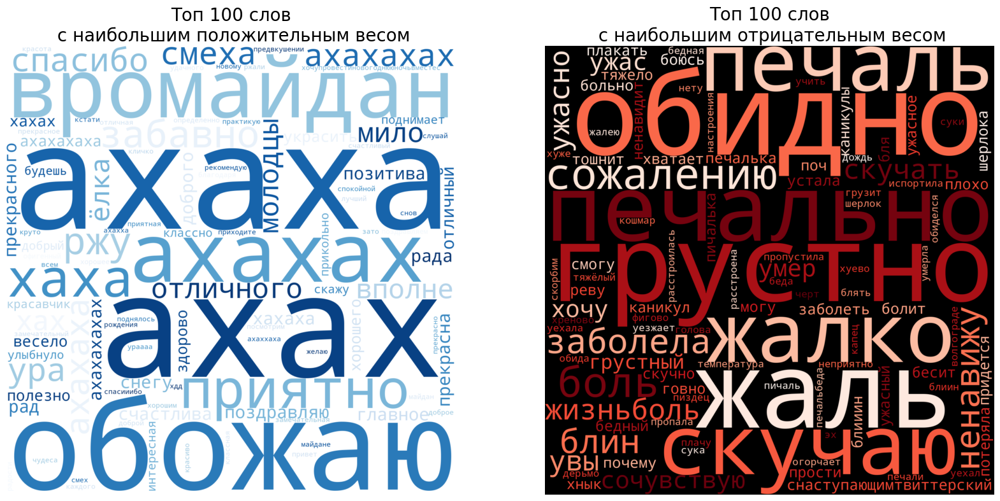

In [103]:
# Выведем картинки сгенерированные вордклаудом
fig, ax = plt.subplots(1, 2, figsize = (20, 12))


ax[0].imshow(wordcloud_positive, interpolation='bilinear')
ax[1].imshow(wordcloud_negative, interpolation='bilinear')

ax[0].set_title('Топ ' +\
                str(weights_max.shape[0]) +\
                ' слов\n с наибольшим положительным весом',
               fontsize = 20
               )
ax[1].set_title('Топ ' +\
                str(weights_min.shape[0]) +\
                ' слов\n с наибольшим отрицательным весом',
               fontsize = 20
               )

ax[0].axis("off")
ax[1].axis("off")

plt.show()

### Снижение размерности признакового пространства модели

In [104]:
fig = make_subplots(1,1)

fig.add_trace(go.Histogram(
    x = weights.query('weights != 0')['weights'],
    #histnorm = 'probability',
    opacity = 0.5,
    showlegend = False
))

fig.add_trace(go.Histogram(
    x = weights.query('weights > 0.25 or weights < -0.25')['weights'],
    #histnorm = 'probability',
    opacity = 0.5,
    showlegend = False
))

fig.update_layout(
    height = 600,
    width = 800,
    xaxis_showgrid=False,
    xaxis_zeroline=False,
    template = 'plotly_dark',
    font_color = 'rgba(212, 210, 210, 1)'
    
)

In [105]:
vocab = weights.query('weights > 0.25 or weights < -0.25')['words']

In [106]:
vocab

1                ааа
2               аааа
3              ааааа
4             аааааа
5            ааааааа
             ...    
170334     ёёлочкууу
170335        ёёпрст
170339    ёёёлочкааа
170340          ёёёё
170342        ёёёёёё
Name: words, Length: 48832, dtype: object

Получим векторные представления текстов

In [107]:
count_idf = TfidfVectorizer(vocabulary=vocab,
                            ngram_range=(1,1))

In [108]:
tf_idf = count_idf.fit_transform(joned_text['text'])

tf_idf_train = count_idf.transform(train['text'])
tf_idf_test = count_idf.transform(test['text'])

In [109]:
display(tf_idf_test.shape)
display(tf_idf_train.shape)

(45367, 48832)

(181467, 48832)

In [110]:
model_lr_base = LogisticRegression(solver = 'lbfgs',
                                    random_state = 12345,
                                    max_iter= 10000,
                                    n_jobs= -1)

Получим прогноз и оценим качество модели

In [111]:
model_lr_base.fit(tf_idf_train, train['label'])

LogisticRegression(max_iter=10000, n_jobs=-1, random_state=12345)

In [112]:
predict_lr_base_proba_1 = model_lr_base.predict_proba(tf_idf_test)

In [113]:
fpr_base_1, tpr_base_1, _ = roc_curve(test['label'], predict_lr_base_proba_1[:, 1])
roc_auc_base_1 = auc(fpr_base_1, tpr_base_1)

In [114]:
fig = make_subplots(1,1,
                    subplot_titles = ["Receiver operating characteristic"],
                    x_title="False Positive Rate",
                    y_title = "True Positive Rate"
                   )

fig.add_trace(go.Scatter(
    x = fpr_base,
    y = tpr_base,
    fill = 'tozeroy',
    name = "ROC curve (area = %0.3f)" % roc_auc_base,
    ))

fig.add_trace(go.Scatter(
    x = fpr_base_1,
    y = tpr_base_1,
    fill = 'tozeroy',
    name = "Less dimensity ROC curve (area = %0.3f)" % roc_auc_base_1,
    ))

fig.add_trace(go.Scatter(
    x = fpr_coin,
    y = tpr_coin,
    mode = 'lines',
    line = dict(dash = 'dash'),
    name = 'Coin classifier'
    ))


fig.update_layout(
    height = 600,
    width = 800,
    xaxis_showgrid=False,
    xaxis_zeroline=False,
    template = 'plotly_dark',
    font_color = 'rgba(212, 210, 210, 1)'
    )

Вывод:

Мы снизили размерность векторов tf-idf потеряв при этом 0.3% качества (площадь под ROC кривой при размерности > 170К 0.809, площадь под ROC кривой при размерности > 48K -- 0.806)

### Подбор оптимального порогового значения классификации

In [115]:
scores = {}

weight = 0.55

for threshold in np.linspace(0, 1, 100):
    
    matrix = confusion_matrix(test['label'],
                 (predict_lr_base_proba[:, 0] <  threshold).astype('float'),
                 normalize='true',
                )

    score = matrix[0,0] * weight + matrix[1,1] * (1 - weight)
    
    scores[threshold] = score

In [116]:
pd.DataFrame({'true_score':scores.values(),
             'threshold':scores.keys()},
             ).sort_values(by = 'true_score', ascending = False).head()

,true_score,threshold
44,0.733457,0.444444
45,0.733021,0.454545
46,0.732878,0.464646
43,0.732444,0.434343
47,0.731603,0.474747


In [117]:
matrix = confusion_matrix(test['label'],
                 (predict_lr_base_proba[:, 0] <  0.444444).astype('int'),
                 normalize='true',
                )
matrix

array([[0.77630404, 0.22369596],
       [0.31891186, 0.68108814]])

In [118]:
# Сделаем красивый график матрицы ошибок

fig = make_subplots(1,1)

fig.add_trace(go.Heatmap(
     y = [ 'positive', 'negative'],
     x = ['predicted_negative', 'predicted_positive'],
     z = [matrix[1, :], matrix[0, :]],
     colorscale = 'PuBu'
))

fig.add_trace(go.Heatmap(
     y = [ 'positive', 'negative'],
     x = ['predicted_negative', 'predicted_positive'],
     z = [matrix[1, :], matrix[0, :]],
     colorscale = 'PuBu'
))

fig.add_annotation(x=0, y=0,
            text = "false negative " + str(round(matrix[1,0], 2)),
            showarrow=False,
            font = dict(color = 'black'),
            yshift=10)

fig.add_annotation(x=1, y=1,
            text = "false positive " + str(round(matrix[0,1], 2)),
            showarrow=False,
            font = dict(color = 'black'),
            yshift=10)

fig.add_annotation(x=1, y=0,
            text = "true positive " + str(round(matrix[1,1], 2)),
            showarrow=False,
            font = dict(color = 'white'),
            yshift=10)

fig.add_annotation(x=0, y=1,
            text = "true negative " + str(round(matrix[0,0], 2)),
            showarrow=False,
            font = dict(color = 'white'),
            yshift=10)


fig.update_layout(height = 500,
                  width = 500,
                  template = 'plotly_dark',
                  font_color = 'rgba(212, 210, 210, 1)',
                 ).show()

## Классификация не размеченных комментариев

C помощью обученных tf-idf векторизатора и логистической регрессии получим оценки вероятности негатива в каждом из комментариев

In [119]:
# очистим тексты комментариев под первым видео
start_clean = time.time()

comments_putin_df['text_clear'] = comments_putin_df['comment']\
                                .apply(lambda x: clean_stop_words(clear_text(str(x)), stopwords))

print('Обработка текстов заняла: '+str(round(time.time() - start_clean, 2))+' секунд')

Обработка текстов заняла: 0.01 секунд


In [120]:
# очистим тексты омментариев под вторым видео
start_clean = time.time()

comments_shulman_df['text_clear'] = comments_shulman_df['comment']\
                                .apply(lambda x: clean_stop_words(clear_text(str(x)), stopwords))

print('Обработка текстов заняла: '+str(round(time.time() - start_clean, 2))+' секунд')

Обработка текстов заняла: 0.01 секунд


### Визуализация ключевых слов

In [121]:
shulman_counter = CountVectorizer(ngram_range=(1, 1))
putin_counter = CountVectorizer(ngram_range=(1, 1))

In [122]:
shulman_count = shulman_counter.fit_transform(comments_shulman_df['text_clear'])
putin_count = putin_counter.fit_transform(comments_putin_df['text_clear'])

In [123]:
shulman_count.toarray().sum(axis = 0).shape

(778,)

In [124]:
shulman_counter.get_feature_names_out().shape

(778,)

In [125]:
# Сохраним списки Idf для каждого класса
shulman_frequence = pd.DataFrame(
    {'word' : shulman_counter.get_feature_names_out(),
     'frequency' : shulman_count.toarray().sum(axis = 0)
    }).sort_values(by = 'frequency', ascending = False)

putin_frequence = pd.DataFrame(
    {'word' : putin_counter.get_feature_names_out(),
     'frequency' : putin_count.toarray().sum(axis = 0)
    }).sort_values(by = 'frequency', ascending = False)

display(shulman_frequence.shape[0])
display(putin_frequence.shape[0])


778

1111

In [126]:
putin_frequence = putin_frequence.query('word not in @shulman_frequence.word')[:100]

In [127]:
shulman_frequence = shulman_frequence.query('word not in @putin_frequence.word')[:100]

In [128]:
# Воспользуемся библиотекой wordcloud для генерации картинок

wordcloud_shulman = WordCloud(background_color="black",
                               colormap = 'Blues',
                               max_words=200,
                               mask=None, 
                                width=1600,
                               height=1600)\
                        .generate_from_frequencies(
                            dict(putin_frequence.values))

wordcloud_putin = WordCloud(background_color="black",
                               colormap = 'Oranges',
                               max_words=200,
                               mask=None, 
                                width=1600,
                               height=1600)\
                        .generate_from_frequencies(
                            dict(shulman_frequence.values))

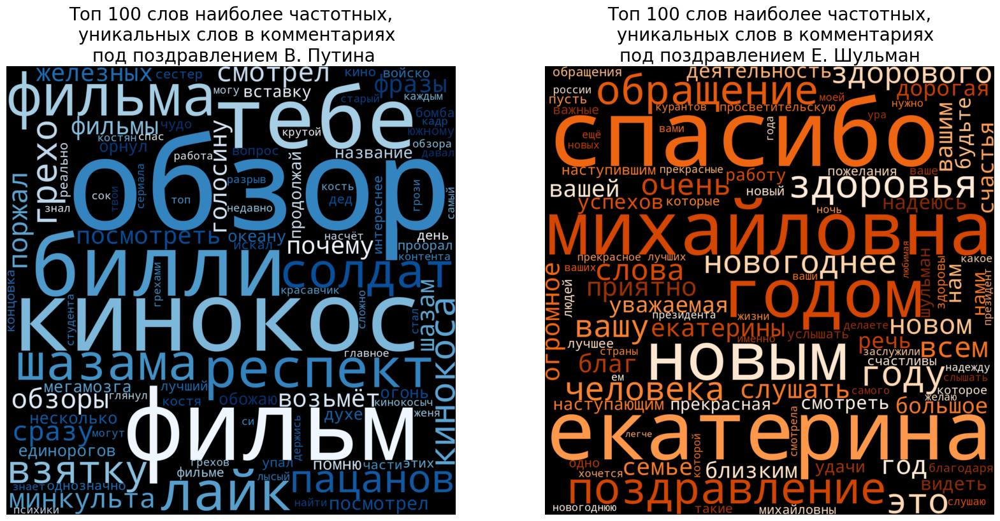

In [129]:
# Выведем картинки сгенерированные вордклаудом
fig, ax = plt.subplots(1, 2, figsize = (20, 12))


ax[0].imshow(wordcloud_shulman, interpolation='bilinear')
ax[1].imshow(wordcloud_putin, interpolation='bilinear')

ax[0].set_title('Топ ' +\
                str(shulman_frequence.shape[0]) +\
                ' слов наиболее частотных,\n ' +\
                ' уникальных слов в комментариях\n' +\
                ' под поздравлением В. Путина',
               fontsize = 20
               )
ax[1].set_title('Топ ' +\
                str(putin_frequence.shape[0]) +\
                ' слов наиболее частотных,\n ' +\
                ' уникальных слов в комментариях\n' +\
                'под поздравлением Е. Шульман',
               fontsize = 20
               )

ax[0].axis("off")
ax[1].axis("off")

plt.show()

## Получение оценки негативности комментария

In [130]:
# Выведем 5 случайных комментариев c оценкой негатива первого видео
for _ in range(5):

    source = comments_putin_df.sample(n=1)
    text_clear = source['text_clear'].values[0]
    text = source['comment'].values[0]

    print(text)

    tf_idf_text = count_idf.transform([text_clear])

    toxic_proba = model_lr_base.predict_proba(tf_idf_text)

    print('Вероятность негатива: ', toxic_proba[:, 0])
    print()

То самое чуство, когда обзор на фильм интереснее чем сам фильм)
Вероятность негатива:  [0.29136815]

Вопрос ещё в том, почему колдун, не явился во сне Билли после распепелирования, чтобы предупредить о колдуне с грехами и преподать парочку уроков о том, как пользоваться силами и что делать чтобы не было, того что творилось и творится в фильме
Вероятность негатива:  [0.69836578]

Я так и знал что за кинокоса обзоры делает искусственный интеллект.
Вероятность негатива:  [0.27431561]

Счетчик киногрехов все меньше, а качество роликов - все выше.
Кинокос на верном пути в создании контента.
Вероятность негатива:  [0.37274241]

за последний кадр однозначно уважение, только парни могут прекратить эту вакханалию.билли мясник сопли не жуёт, даже умирая, с усмешкой суперов стирает, брутален, силен, однозначно звездат, по силе ж сравнится лишь...с войском железных солдат.вообще не понимаю какие могут быть суперы во вселенной, где существует крептонец.
Вероятность негатива:  [0.29288474]



In [131]:
# Выведем 5 случайных комментариев c оценкой негатива второго видео
for _ in range(5):

    source = comments_shulman_df.sample(n=1)
    text_clear = source['text_clear'].values[0]
    text = source['comment'].values[0]

    print(text)

    tf_idf_text = count_idf.transform([text_clear])

    toxic_proba = model_lr_base.predict_proba(tf_idf_text)

    print('Вероятность негатива: ', toxic_proba[:, 0])
    print()

Любимый позитивчик! Спасибо. Улыбаюсь и слушаю очень внимательно всегда. Здоровья вам и вашим близким. Все будет хорошо. Обнимаю. Бабушка Оля.
Вероятность негатива:  [0.08332114]

Единственное обращение, которое хочется смотреть.
Вероятность негатива:  [0.75525359]

Екатерина Михайловна, спасибо огромное! Вас так приятно слушать и смотреть ! С Праздником Друзья! С Новым 2022 годом!!
Вероятность негатива:  [0.17551622]

Благодарю! Спасибо Вам, за Вашу деятельность и само существование. Будьте здоровы и счастливы!

Всем удачи и счастья в Новом Году.️️
Вероятность негатива:  [0.06946284]

Екатерина  Михайловна , огромное  спасибо ! Как  приятно  Вас  слушать  и  смотреть  на  Вас !  С  Новым  годом !!!
Вероятность негатива:  [0.26743976]



In [132]:
# Получим оценки негатива для всех комментариев первого и второго видео

putin_tf_idf = count_idf.transform(comments_putin_df['text_clear'])
shulman_tf_idf = count_idf.transform(comments_shulman_df['text_clear'])

putin_negative_proba = model_lr_base.predict_proba(putin_tf_idf)
shulman_negative_proba = model_lr_base.predict_proba(shulman_tf_idf)

comments_putin_df['negative_proba'] = putin_negative_proba[:, 0]
comments_shulman_df['negative_proba'] = shulman_negative_proba[:, 0]

Найдем доли негативных комментариев при оптимальном пороговом значении

In [133]:
putin_share_neg = (comments_putin_df['negative_proba'] > 0.44).sum() / comments_putin_df.shape[0]
putin_share_neg

0.3058823529411765

In [134]:
shulman_share_neg = (comments_shulman_df['negative_proba'] > 0.44).sum() / comments_shulman_df.shape[0]
shulman_share_neg

0.32934131736526945

In [135]:
fig = make_subplots(1,1,
                   subplot_titles=['Распределение комментариев по оценке негативности']     
                   )

fig.add_trace(go.Violin(
    x = comments_shulman_df['negative_proba'],
    meanline_visible = True,
    name = 'Shulman (N = %i)' % comments_putin_df.shape[0],
    side = 'positive',
    spanmode = 'hard'
))



fig.add_trace(go.Violin(
    x = comments_putin_df['negative_proba'],
    meanline_visible = True,
    name = 'Putin (N = %i)' % comments_shulman_df.shape[0],
    side = 'positive',
    spanmode = 'hard'
))


fig.add_annotation(x=0.8, y=1.5,
            text = "%0.2f — доля негативных комментариев (при p > 0.44)"\
                   % putin_share_neg,
            showarrow=False,
            yshift=10)

fig.add_annotation(x=0.8, y=0.5,
            text = "%0.2f — доля негативных комментариев (при p > 0.44)"\
                   % shulman_share_neg,
            showarrow=False,
            yshift=10)

fig.update_traces(orientation='h', 
                  width = 1.5,
                  points = False
                 )


fig.update_layout(height = 500,
                  #xaxis_showgrid=False,
                  xaxis_zeroline=False,
                  template = 'plotly_dark',
                  font_color = 'rgba(212, 210, 210, 1)',
                  legend=dict(
                    y=0.9,
                    x=-0.1,
                    yanchor='top',
                    ),
                 )
fig.update_yaxes(visible = False)
              


fig.show()